# Tutorial 2: Visium HD: Human Tonsil

 <div style="margin:0; line-height:1.2">

 Analyze human tonsil spatial transcriptomics data with SpacGPA.<br/>



 Data source: https://www.10xgenomics.com/datasets/visium-hd-cytassist-gene-expression-human-tonsil-fresh-frozen  <br/>



 This is a human tonsil sample generated with Visium HD.<br/>

 <div>

In [1]:
# Import SpacGPA and other required packages.
import SpacGPA as sg
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
import os
import warnings
warnings.filterwarnings("ignore", message=r".*Variable names are not unique.*")

In [2]:
# Set the working directory to your local path.
workdir = '..'
os.chdir(workdir)


### Part 1: Gene program analysis via SpacGPA ###

In [3]:
# For Visium HD data, we recommend using the binned outputs (e.g. 16μm binning here) for analysis.
# Before first-time use, construct the tissue_positions.csv from the tissue_positions.parquet file for easy reading.
# A demo for file conversion:
df_tissue_positions = pd.read_parquet("data/visium_HD/Human_Tonsil/binned_outputs/square_016um/spatial/tissue_positions.parquet")
df_tissue_positions.to_csv("data/visium_HD/Human_Tonsil/binned_outputs/square_016um/spatial/tissue_position.csv", index = False, header = None)
df_tissue_positions.to_csv("data/visium_HD/Human_Tonsil/binned_outputs/square_016um/spatial/tissue_positions_list.csv", index = False, header = None)


In [4]:
# Load spatial transcriptomics data.
adata = sc.read_visium("data/visium_HD/Human_Tonsil/binned_outputs/square_016um/",
                       count_file = "filtered_feature_bc_matrix.h5")
adata.var_names_make_unique()
adata.var_names = adata.var['gene_ids']
print(adata)


AnnData object with n_obs × n_vars = 175448 × 18085
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'


In [5]:
# Preprocessing: library-size normalize and log1p-transform.
sc.pp.normalize_total(adata, target_sum = 1e4)
sc.pp.log1p(adata)
sc.pp.filter_cells(adata, min_genes = 200)
sc.pp.filter_genes(adata, min_cells = 10)
print(adata.X.shape)


(161086, 17424)


In [6]:
# Construct the co-expression network using SpacGPA (Gaussian graphical model).
ggm = sg.create_ggm(adata, project_name = "Human Tonsil")


Please Normalize The Expression Matrix Before Running!
Loading Data.

Running all calculations on GPU (if available).
Using single precision (float32) for all calculations.
Using chunk size of 5000 for efficient computation

Computing the number of cells co-expressing each gene pair...
Computing covariance matrix...
Computing Pearson correlation matrix...

Calculating partial correlations in 7590 iterations.
Number of genes randomly selected in each iteration: 2000
Iteration: 7590/7590, Avg loop time: 0.0380 s, Elapsed time: 4.95 min, Estimated time left: 0.00 min.                  
All iterations completed.

Performing FDR control...
Randomly redistribute the expression distribution of input genes...

Calculate correlation between genes after redistribution...

Computing the number of cells co-expressing each gene pair...
Computing covariance matrix...
Computing Pearson correlation matrix...

Calculating partial correlations in 7590 iterations.
Number of genes randomly selected in eac

In [7]:
# Show statistically significant co-expression gene pairs.
print(ggm.SigEdges.head(5))


             GeneA            GeneB      Pcor  SamplingTime         r  \
0  ENSG00000186827  ENSG00000186891  0.068162            88  0.107408   
1  ENSG00000179403  ENSG00000235098  0.042252           116  0.196542   
2  ENSG00000078900  ENSG00000188157  0.027518            86  0.201791   
3  ENSG00000215788  ENSG00000186891  0.029896           117  0.065076   
4  ENSG00000215788  ENSG00000186827  0.023048           104  0.084119   

   Cell_num_A  Cell_num_B  Cell_num_coexpressed       Project  
0       14924       23910                  4237  Human Tonsil  
1       19960       16993                  4953  Human Tonsil  
2       10219       38161                  6077  Human Tonsil  
3       71949       23910                 13242  Human Tonsil  
4       71949       14924                  9016  Human Tonsil  


In [8]:
# For first-time use SpacGPA on a new species, download the GO annotations via sg.get_go_annotations.
# Which will also provide the ENSEMBL to gene symbol mapping file.
sg.get_GO_annoinfo(species_name = 'human')



[MyGene] Building ALL-genes Ensembl→symbol table for species='human' ...
Fetching 82804 gene(s) . . .
No more results to return.
[MyGene] Build Ensembl→symbol mapping file for species='human' successfully

Querying MyGene.info for human genes with GO annotations ...
Total genes with GO annotation (reported): 20835

Fetching all genes with GO annotation ...
Fetching 20835 gene(s) . . .
No more results to return.
[MyGene] Saved GO annotation file for species='human' successfully


In [9]:
# Identify gene programs using the MCL-Hub algorithm (set inflation to 2).
ggm.find_modules(method = 'mcl-hub', inflation = 2, convert_to_symbols = True, species = 'human')
# the parameter 'convert_to_symbols' provides gene symbols in the output programs for better interpretability.



Find modules using MCL-Hub...
Current Pcor: 0.02
Total significantly co-expressed gene pairs: 42262
Iteration: 20, Max change: 0.00000000 
Converged at iteration 20.

1 modules were removed due to their linear or radial topology structure out of 49 modules.

Converting Ensembl IDs to gene symbols...


In [10]:
# Inspect the top 5 identified gene programs.
print(ggm.modules_summary.head(5))


  module_id  size  num_genes_degree_ge_2  \
0        M1   224                    152   
1        M2   223                    176   
2        M3   212                    187   
3        M4   196                    135   
4        M5   196                    165   

                                         all_symbols  \
0  COL17A1, KRT15, KREMEN2, S100A2, TNS4, LAMB3, ...   
1  SYT8, GBP6, BARX2, KRT13, CA12, CLCA2, CRABP2,...   
2  VWF, ACKR1, COL15A1, CLDN5, SPARCL1, CCL14, AQ...   
3  CCL21, TCF7, CCR7, TRAC, TRBC1, TRBC2, CD3E, C...   
4  H1-5, TOP2A, KIFC1, CDK1, HMGB2, MKI67, CDT1, ...   

                                           all_genes  
0  ENSG00000065618, ENSG00000171346, ENSG00000131...  
1  ENSG00000149043, ENSG00000183347, ENSG00000043...  
2  ENSG00000110799, ENSG00000213088, ENSG00000204...  
3  ENSG00000137077, ENSG00000081059, ENSG00000126...  
4  ENSG00000184357, ENSG00000131747, ENSG00000237...  


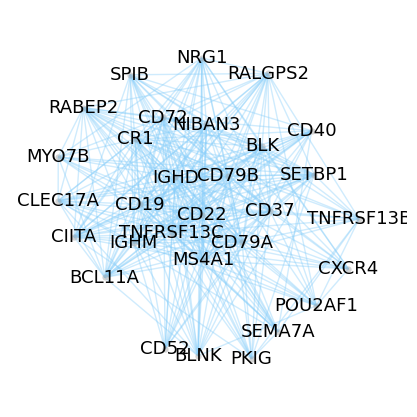

In [11]:
# Visualize the subnetwork of program M8 (top 30 genes by degree/connectivity for readability).
ggm.module_network_plot(module_id = 'M8', seed = 1, layout_iterations = 55)
# Fix layout randomness for reproducibility via set seed.


In [12]:
# Gene Ontology (GO) enrichment analysis with BH FDR control and p-value threshold 0.05.
ggm.go_enrichment_analysis(species = 'human', padjust_method = "BH", pvalue_cutoff = 0.05)



Reading GO term information for |human|...

Start GO enrichment analysis ...
Found 160 significant enriched GO terms in M48       
GO enrichment analysis completed. Found 4918 significant enriched GO terms total.


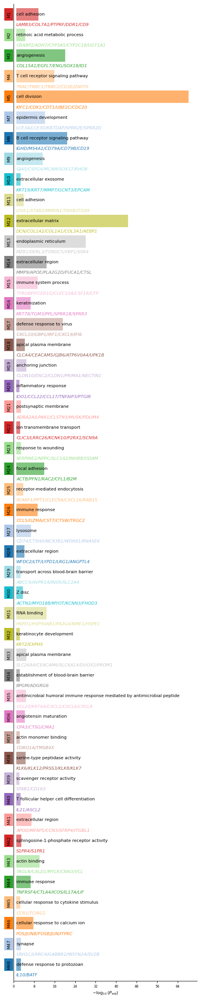

In [13]:
# Visualize top enriched GO terms for all identified programs.
ggm.module_go_enrichment_plot(shown_modules = ggm.modules_summary['module_id'].tolist(), go_per_module = 1,
                              fig_width = 5.5)


    module_id  module_size  go_rank       go_id         go_category  \
822        M8          169        1  GO:0050853  biological_process   
823        M8          169        2  GO:0042113  biological_process   
824        M8          169        3  GO:0002376  biological_process   

                               go_term  
822  B cell receptor signaling pathway  
823                  B cell activation  
824              immune system process  


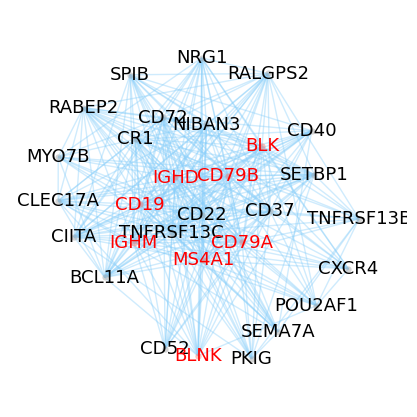

In [14]:
# Visualize the M8 network with nodes highlighted by a selected GO term.
# Program M8 is associated with B cell.
M8_GO_Enrich = ggm.go_enrichment[ggm.go_enrichment['module_id'] == 'M8']
print(M8_GO_Enrich.iloc[:3, :6])
ggm.module_network_plot(module_id = 'M8', highlight_anno = "B cell receptor signaling pathway", seed = 1, layout_iterations = 55)


In [15]:
# Print a summary of the GGM analysis.
print(ggm)


View of ggm object: Human Tonsil
MetaInfo:
  Gene Number: 17424
  Sample Number: 161086
  Pcor Threshold: 0.02

Results:
  SigEdges: DataFrame with 42262 significant gene pairs
  modules: 48 modules with 3868 genes
  modules_summary: DataFrame with 48 rows
  FDR: Exists



In [16]:
# Save the GGM object to HDF5 for later reuse.
sg.save_ggm(ggm, "data/Human_Tonsil_HD.ggm.h5")


### Part 2: Spot annotation based on program expression ###

In [17]:
# Compute per-spot expression scores of each gene program.
sg.calculate_module_expression(adata, ggm)



Calculating module expression using top 30 genes...

Calculating gene weights based on degree...
Storing module information in adata.uns['module_info']...

Assigning colors to 48 modules...

Total 48 modules' average expression calculated and stored in adata.obs and adata.obsm


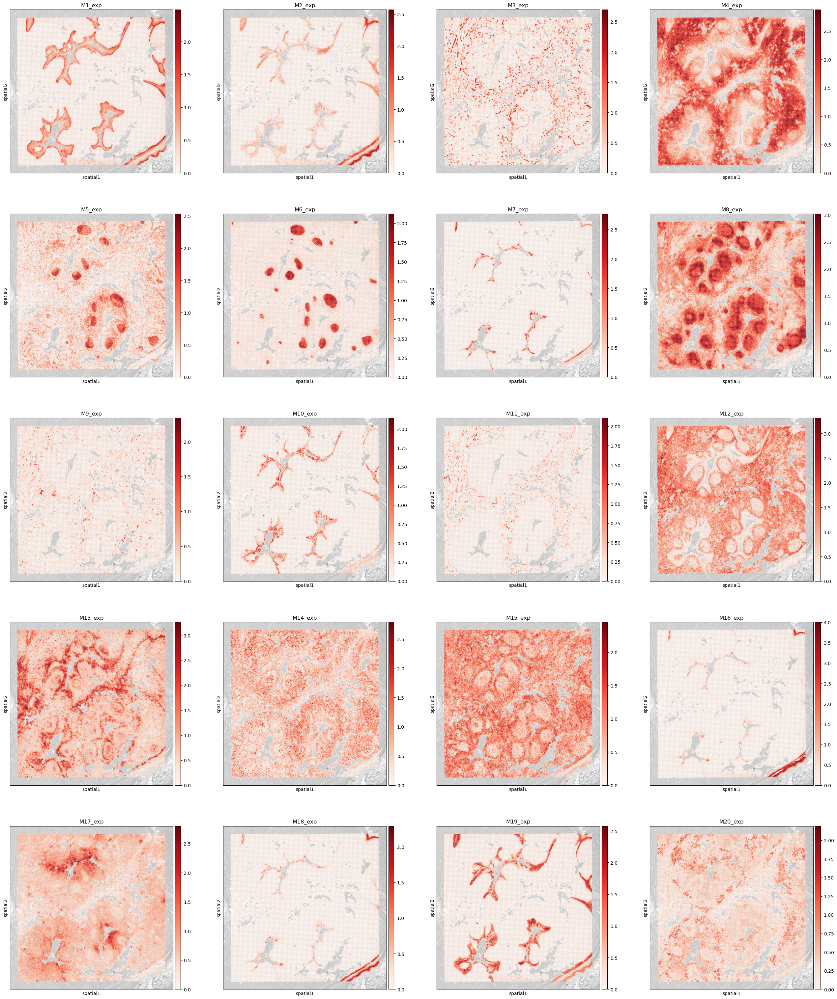

In [18]:
# Visualize the spatial distribution of the top 20 program-expression scores.
plt.rcParams["figure.figsize"] = (7, 7)
program_list = ggm.modules_summary['module_id'] + '_exp'
sc.pl.spatial(adata, size = 1.2, alpha_img = 0.5, bw = True, color = program_list[:20], cmap = 'Reds', ncols = 4)


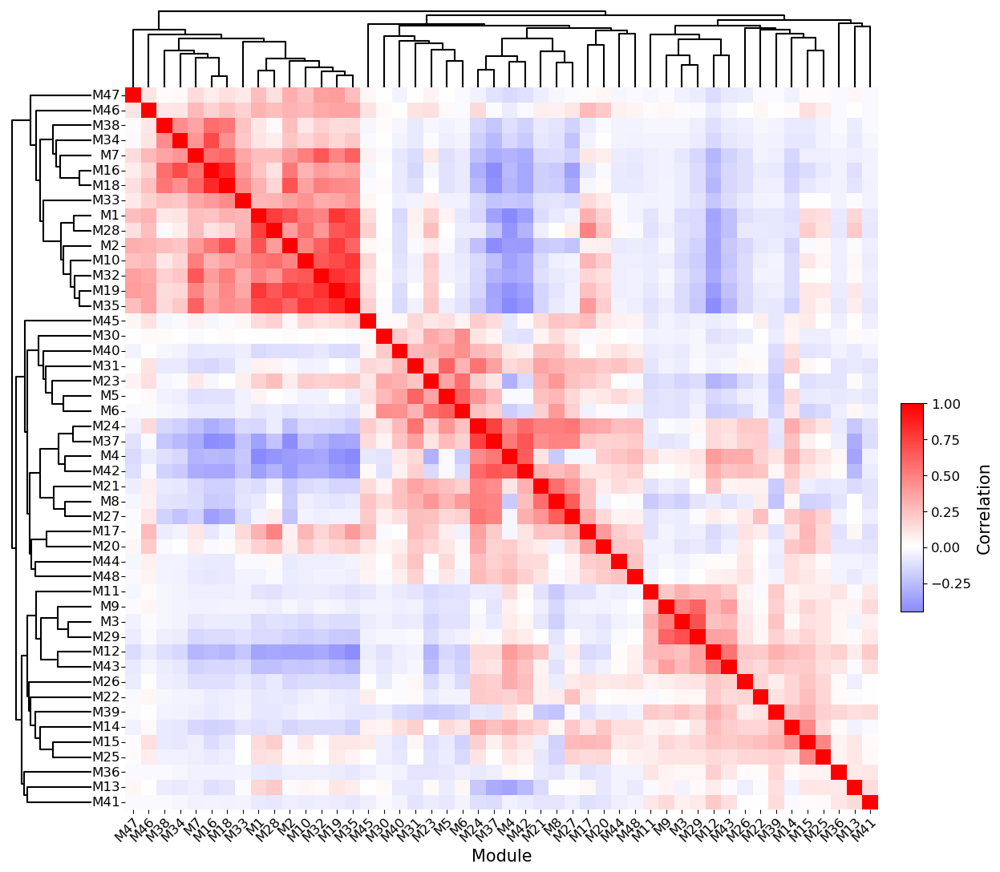

In [19]:
# Compute pairwise program similarity and plot the correlation heatmap with dendrograms.
sg.module_similarity_plot(adata, ggm_key = 'ggm', corr_method = 'pearson', heatmap_metric = 'correlation', 
                          fig_height = 13, fig_width = 14, dendrogram_height = 0.1, dendrogram_space = 0.08, return_summary = False)


In [20]:
# Assign spot-level annotations via Gaussian Mixture Models (GMMs) based on program expression.
sg.calculate_gmm_annotations(adata, ggm_key = 'ggm')


M1 processed successfully, annotated cells: 30352
M2 processed successfully, annotated cells: 20573
M3 processed successfully, annotated cells: 19837
M4 processed successfully, annotated cells: 15662
M5 processed successfully, annotated cells: 16909
M6 processed successfully, annotated cells: 8765
M7 processed successfully, annotated cells: 8227
M8 processed successfully, annotated cells: 7527
M9 processed successfully, annotated cells: 6557
M10 processed successfully, annotated cells: 21293
M11 processed successfully, annotated cells: 7605
M12 processed successfully, annotated cells: 10025
M13 processed successfully, annotated cells: 17838
M14 processed successfully, annotated cells: 5980
M15 processed successfully, annotated cells: 2040
M16 processed successfully, annotated cells: 7067
M17 processed successfully, annotated cells: 3231
M18 processed successfully, annotated cells: 7890
M19 processed successfully, annotated cells: 25120
M20 processed successfully, annotated cells: 5357


In [21]:
# Optionally smooth the annotations using spatial k-NN (on the 'spatial' embedding).
sg.smooth_annotations(adata, ggm_key = 'ggm', embedding_key = 'spatial', k_neighbors = 24)


M1 processed. remain cells: 32740
M2 processed. remain cells: 23795
M3 processed. remain cells: 21487
M4 processed. remain cells: 18780
M5 processed. remain cells: 17606
M6 processed. remain cells: 9019
M7 processed. remain cells: 9212
M8 processed. remain cells: 8920
M9 processed. remain cells: 6106
M10 processed. remain cells: 22896
M11 processed. remain cells: 7522
M12 processed. remain cells: 10495
M13 processed. remain cells: 20598
M14 processed. remain cells: 5112
M15 processed. remain cells: 1432
M16 processed. remain cells: 7865
M17 processed. remain cells: 3759
M18 processed. remain cells: 8938
M19 processed. remain cells: 27379
M20 processed. remain cells: 5230
M21 processed. remain cells: 8425
M22 processed. remain cells: 6119
M23 processed. remain cells: 5405
M24 processed. remain cells: 0
M25 processed. remain cells: 29179
M26 processed. remain cells: 93437
M27 processed. remain cells: 0
M28 processed. remain cells: 40376
M29 processed. remain cells: 18979
M30 processed. r

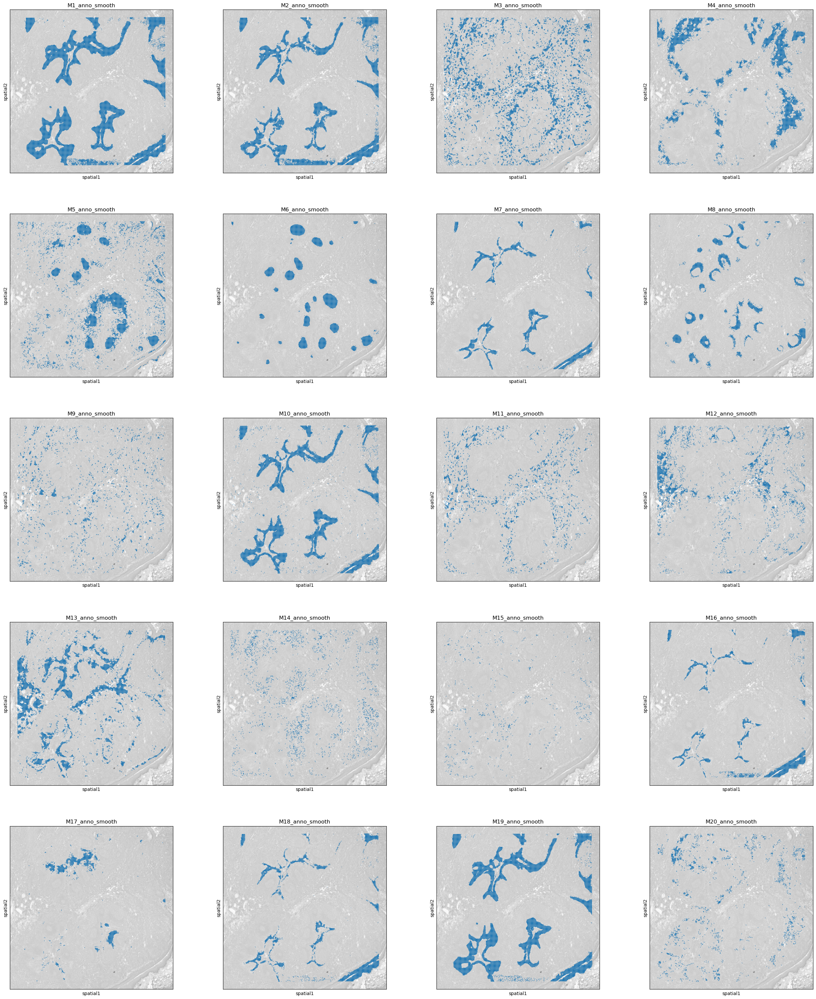

In [22]:
# Display smoothed annotations for top 20 programs.
# If smoothing is skipped, use 'M1_anno' … 'M20_anno' instead.
plt.rcParams["figure.figsize"] = (7, 7)
program_list = ggm.modules_summary['module_id'] + '_anno_smooth'
sc.pl.spatial(adata, size = 1.2, alpha_img = 0.5, bw = True, color = program_list[:20], legend_loc = None, ncols = 4)
# Where the blue nodes indicate the spots annotated by the program, and gray nodes are unassigned.



In [23]:
# Integrate multiple program-derived annotations into a single label set via sg.integrate_annotations.
sg.integrate_annotations(adata, ggm_key = 'ggm', result_anno = 'ggm_annotation', neighbor_similarity_ratio = 0.6)
# Here we integrate all programs as an example. You can specify a subset of programs via the 'modules_used' parameter.




Calculating 24 nearest neighbors for each cell based on spatial embedding...


144020 of total 161086 cells have multiple annotations. Among them, 
    25310 cells are resolved by neighbors.
    118710 cells are resolved by expression score.

Integrated annotation stored in adata.obs['ggm_annotation'].



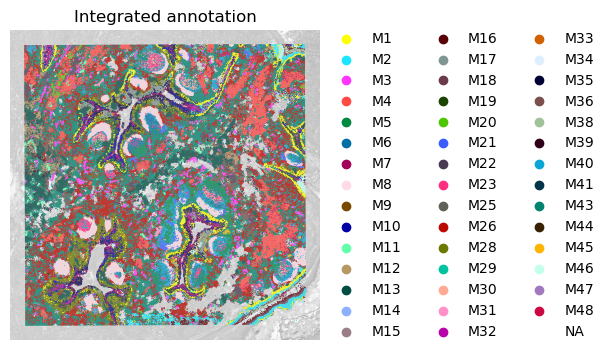

In [24]:
# Visualize the integrated annotation.
plt.rcParams["figure.figsize"] = (4, 6)
sc.pl.spatial(adata, size = 1.2, alpha_img = 0.5, bw = True, color = ['ggm_annotation'], frameon = False, title = 'Integrated annotation')


### Part 3: Cluster spots based a dimensionality reduction of program expression ###

In [25]:
# Build a neighborhood graph based on program expression and perform clustering.
sc.pp.neighbors(adata, 
                use_rep='module_expression_scaled',
                n_pcs=adata.obsm['module_expression_scaled'].shape[1])
sc.tl.leiden(adata, resolution=2, key_added='leiden_ggm')
sc.tl.louvain(adata, resolution=2, key_added='louvan_ggm')


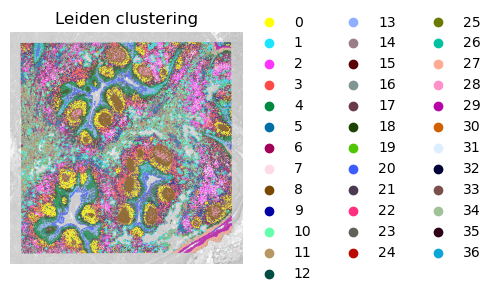

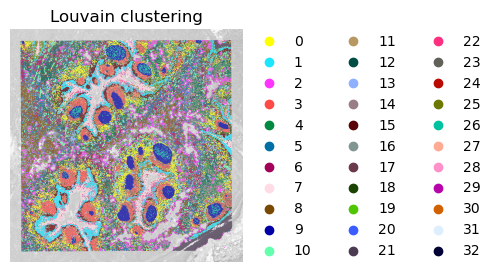

In [26]:
# Visualize the clustering results.
plt.rcParams["figure.figsize"] = (3, 6)
sc.pl.spatial(adata, size = 1.2, alpha_img = 0.5, bw = True, color = ['leiden_ggm'], frameon = False, title = 'Leiden clustering')
plt.rcParams["figure.figsize"] = (3, 6)
sc.pl.spatial(adata, size = 1.2, alpha_img = 0.5, bw = True, color = ['louvan_ggm'], frameon = False, title = 'Louvain clustering')


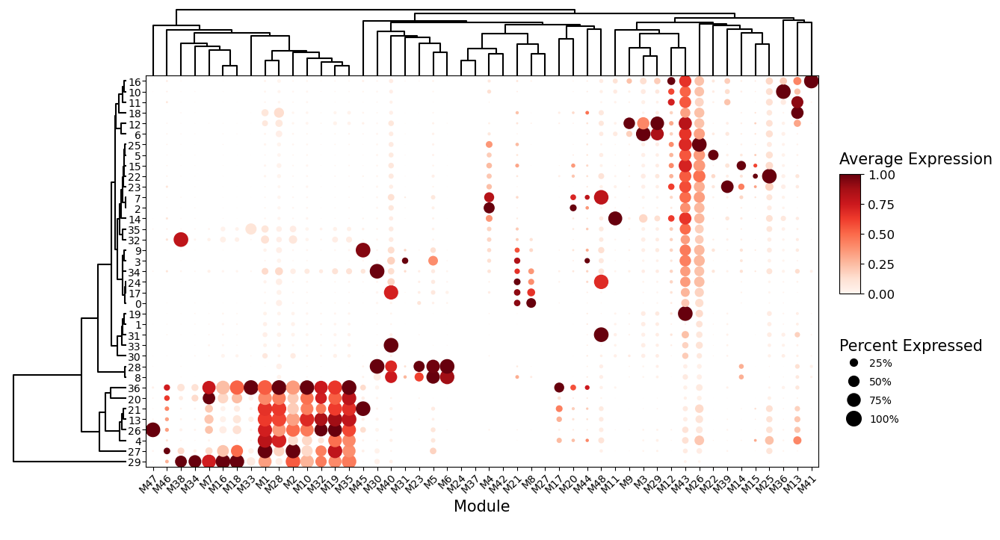

In [27]:
# Summarize program-expression across the leiden clusters clusters as a dot plot.
sg.module_dot_plot(adata, ggm_key = 'ggm', groupby = 'leiden_ggm', scale=True,
                   dendrogram_height = 0.15, dendrogram_space = 0.05, fig_height=8, fig_width = 14, axis_fontsize = 10)


In [28]:
# Save the annotated AnnData object.
adata.write("data/Human_Tonsil_HD_ggm_anno.h5ad")
